In [1]:
from utils.load_dataset import *
from utils.custom_utils import *

# VIRTUAL DATASET

In [2]:
train_df = load_data("train_dataset.txt")
train_df.head()

,img_path,x0,y0,x1,y1,label
0,19-12-09_1652_624622812/000_03_04.png,463.0,204.0,560.0,241.0,2
1,19-12-09_1652_624622812/000_03_04.png,64.0,470.0,210.0,540.0,2
2,19-12-09_1652_624622812/000_03_04.png,267.0,464.0,332.0,535.0,1
3,19-12-09_1652_624622812/000_03_04.png,577.0,184.0,610.0,294.0,1
4,19-12-09_1652_624622812/000_03_04.png,346.0,268.0,421.0,366.0,1


In [3]:
print(f'The images in training are: {get_values(train_df)}')
print(f'Label distribution in training is: {get_labels_distribution(train_df)}')

The images in training are: 6071
Label distribution in training is: 1    26125
2     7456
Name: label, dtype: int64


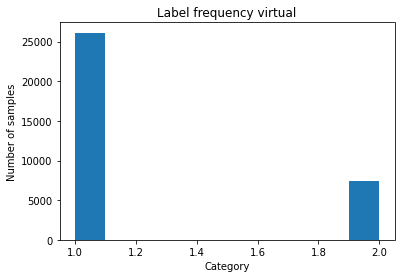

In [4]:
plt.title("Label frequency virtual")
plt.hist(train_df['label'])
plt.xlabel("Category")
plt.ylabel("Number of samples")
plt.show()

In [5]:
print(f"Dataset shape is {train_df.shape}")

#number of images in dir
folder_images = []
for f in files:
  if "mask" not in f:
    folder_images.append(f)
print(f"Images in folder are {len(folder_images)}")

Dataset shape is (33581, 6)
Images in folder are 12148


Some images from dataset...


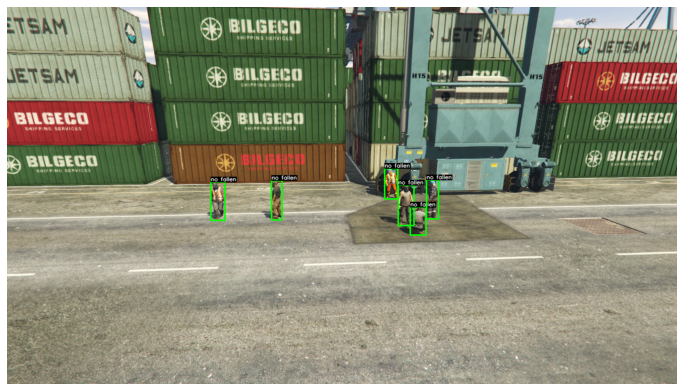

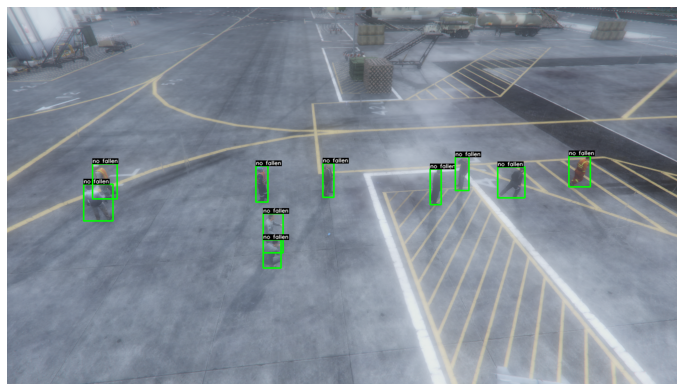

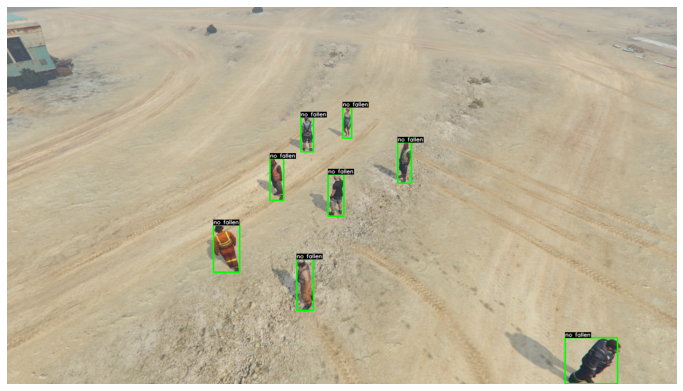

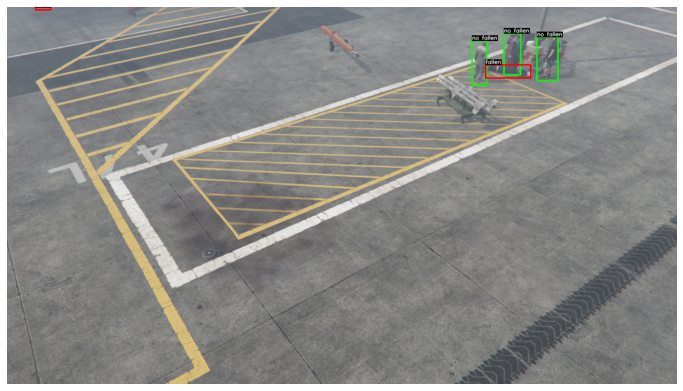

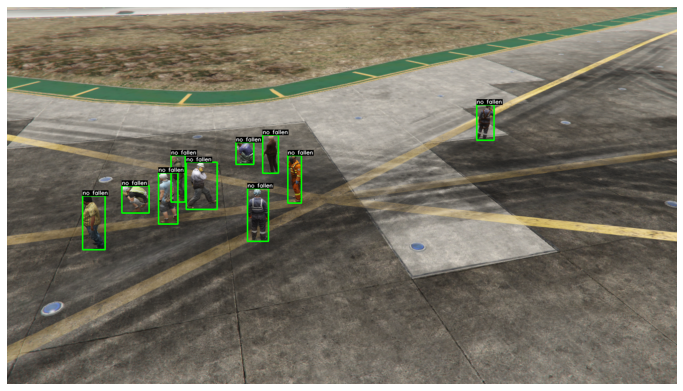

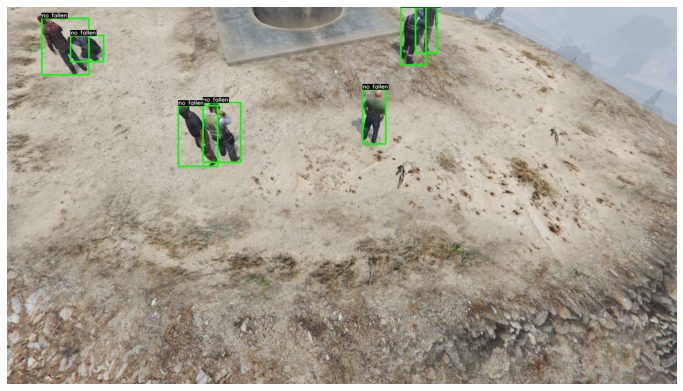

In [6]:
print("Some images from dataset...")

random_list = [random.randint(0,len(train_df['img_path'].unique())) for i in range(6)]

visualize_images_and_bb(DATASET, train_df, random_list, "virtual_images") #None, test_images or virtual images

# TRAINING AND VALIDATION SET

In [6]:
train, valid = split_train_valid(train_df,0.8)

print(f"Train shape is {train.shape} and Validation shape is {valid.shape}")

Train shape is (26861, 6) and Validation shape is (6720, 6)


In [10]:
print(f'The images actually in training are: {get_values(train)}')
print(f'Actual label distribution in training is: {get_labels_distribution(train)}')

The images actually in training are: 4857
Actual label distribution in training is: 1    20675
2     6186
Name: label, dtype: int64


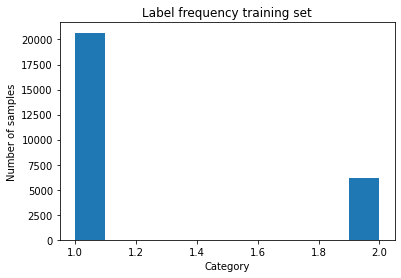

In [7]:
plt.title("Label frequency training set")
plt.hist(train['label'])
plt.xlabel("Category")
plt.ylabel("Number of samples")
plt.show()

In [11]:
print(f'The images in validation are: {get_values(valid)}')
print(f'Label distribution in validation is: {get_labels_distribution(valid)}')

The images in validation are: 1214
Label distribution in validation is: 1    5450
2    1270
Name: label, dtype: int64


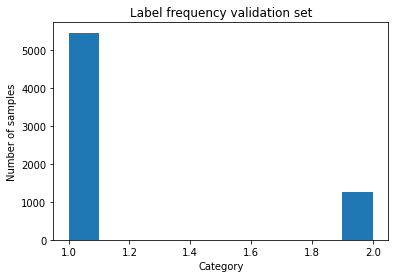

In [8]:
plt.title("Label frequency validation set")
plt.hist(valid['label'])
plt.xlabel("Category")
plt.ylabel("Number of samples")
plt.show()

Class counts [20675, 6186]
Class weights: [0.2992019347037485, 1.0]
                                               x0          y0          x1  \
img_path                                                                    
19-12-05_1733_281439187/000_02_00.png  591.500000  359.750000  630.000000   
19-12-05_1733_281439187/000_03_00.png  549.166667  459.166667  618.500000   
19-12-05_1733_281439187/000_03_01.png  359.200000  326.800000  455.600000   
19-12-05_1733_281439187/000_03_02.png  370.250000  331.500000  549.750000   
19-12-05_1733_281439187/000_03_03.png  619.500000  403.166667  715.833333   

                                               y1  label   weights  
img_path                                                            
19-12-05_1733_281439187/000_02_00.png  440.000000   1.00  0.299202  
19-12-05_1733_281439187/000_03_00.png  540.666667   1.50  0.649601  
19-12-05_1733_281439187/000_03_01.png  399.000000   1.60  0.719681  
19-12-05_1733_281439187/000_03_02.png  426.0000

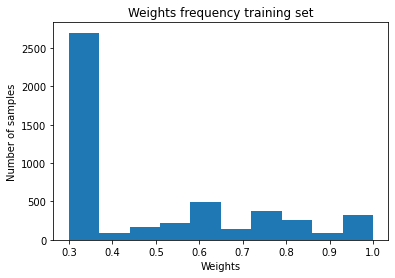

In [20]:
def make_w(dataset): #it is the same function make_weights in custom_utils.py but here we have added some prints
    labels = list(dataset['label'].values)
    class_counts = dataset['label'].value_counts().tolist()
    print(f"Class counts {class_counts}")
    num_samples = len(labels)
    class_weights = [class_counts[1]/class_counts[i] for i in range(len(class_counts))]
    print(f"Class weights: {class_weights}")
    weights = [class_weights[0] if l == 1 else class_weights[1] for l in labels]
    dataset_grouped = dataset.copy()
    dataset_grouped['weights'] = weights
    train_grouped = dataset_grouped.groupby(['img_path']).mean()
    print(train_grouped.head())
    return list(train_grouped['weights'].values)
weights = make_w(train)
plt.title("Weights frequency training set")
plt.hist(weights)
plt.xlabel("Weights")
plt.ylabel("Number of samples")
plt.show()

In [15]:
train_dataset = FallenPeople(train, "data", FallenPeople.train_transform())

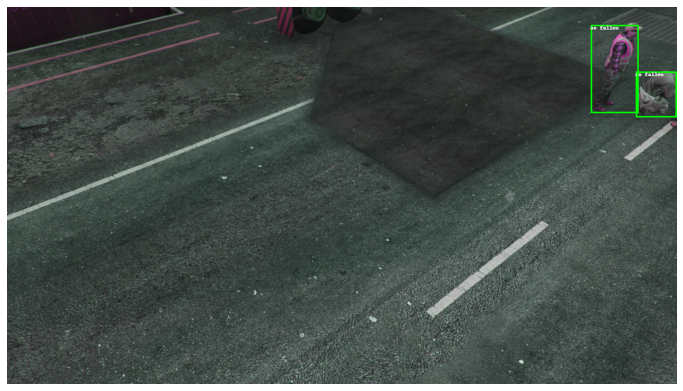

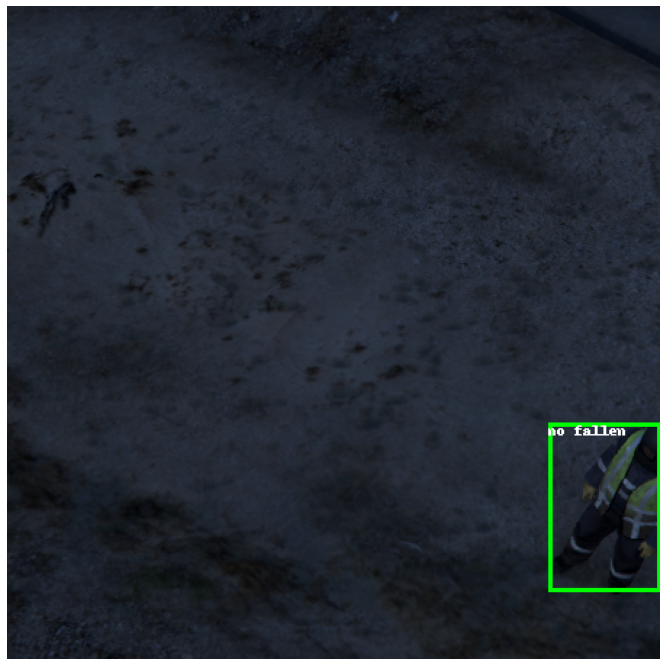

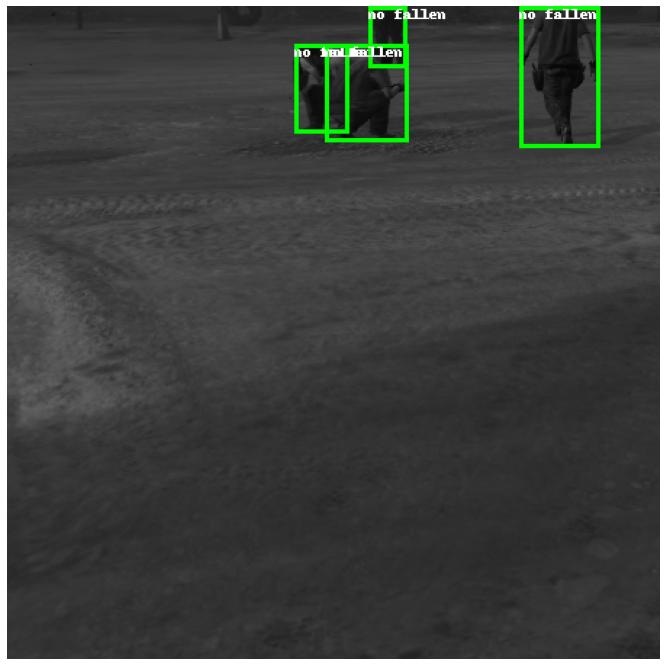

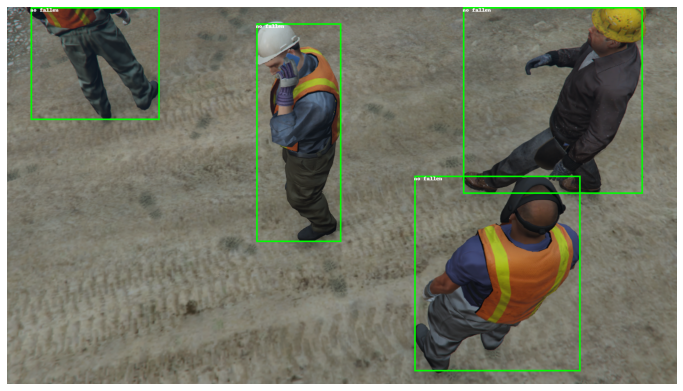

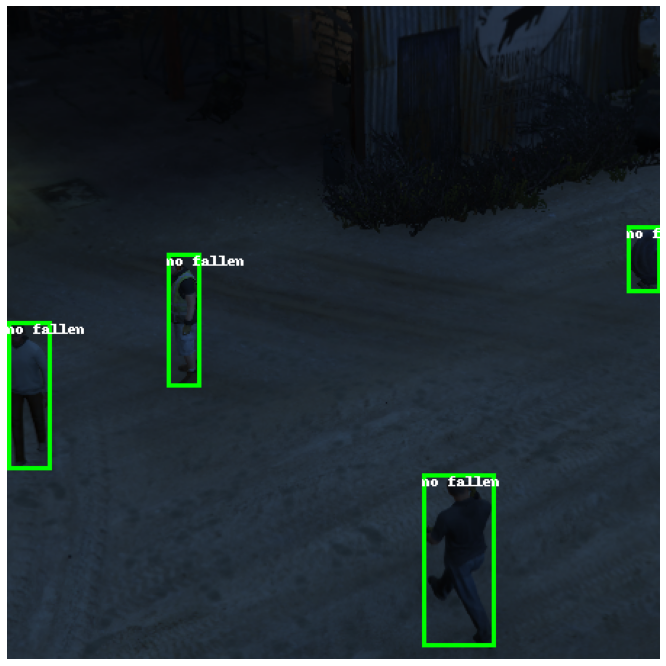

...

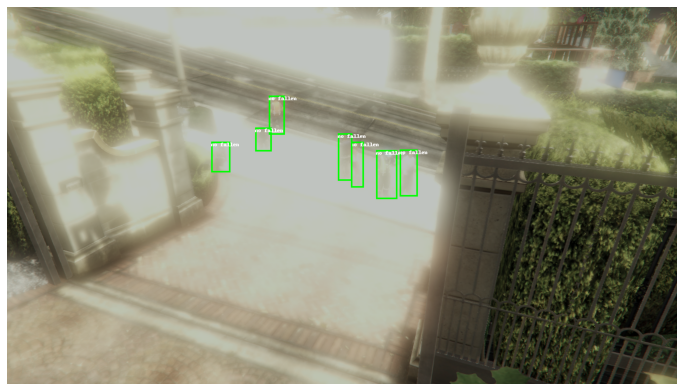

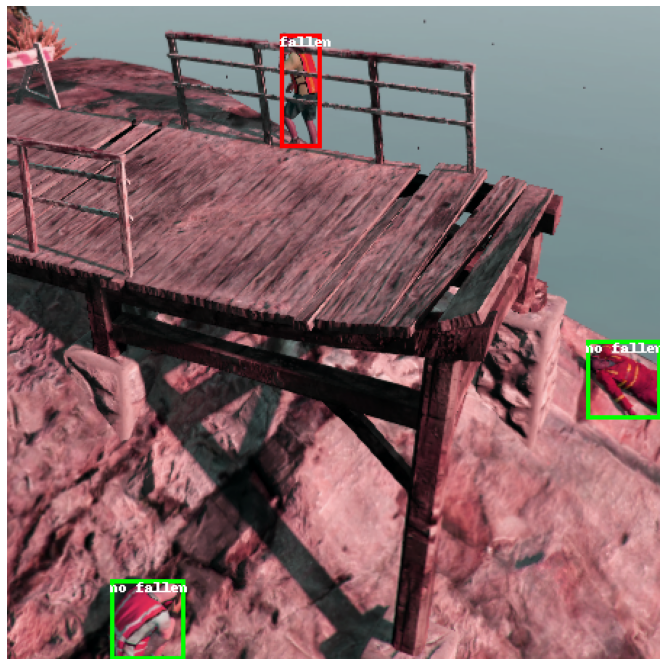

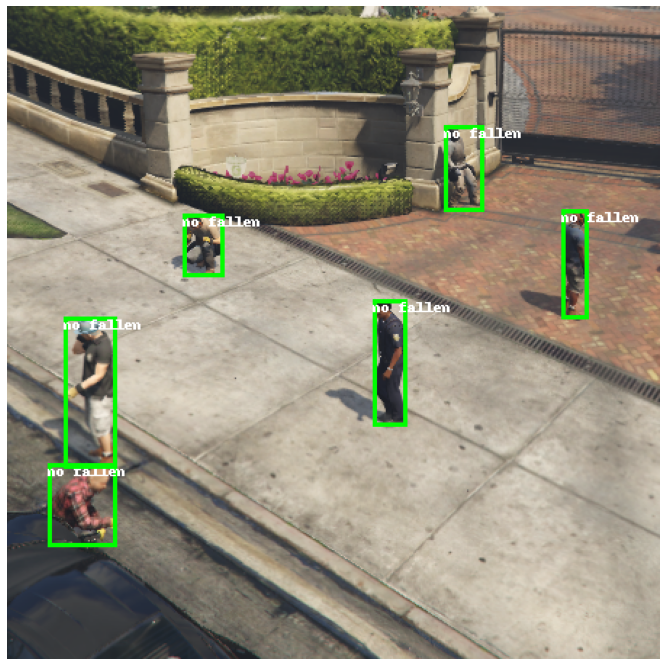

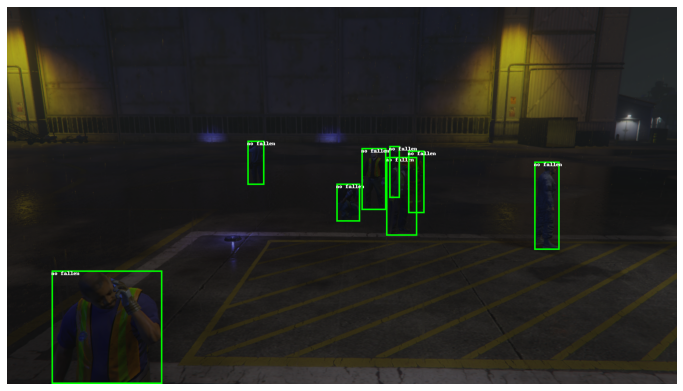

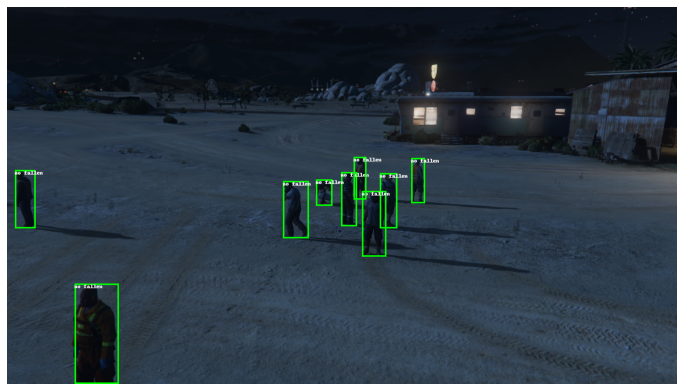

In [18]:
rl = [random.randint(0,train_dataset.__len__()) for i in range(20)]
visualize_from_tensor_and_bb(train_dataset, rl)